<a href="https://colab.research.google.com/github/Isabel-Su/Wave-Simulator/blob/main/Copy_of_6_9_25_APC_Wave_Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 6/9 Version of Wave Simulator

changing energy... trying to display how energy changes w/ respect to time. incomplete, code will not run

## Importing Libraries

In [ ]:
# %matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation

from IPython.display import HTML


## Set Initial Conditions

In [ ]:
N = 100  # num of blocks
k = 100.0  # spr const
b = 0 # air resistance
m = 1.0  # mass of each block
dt = .01  # time step
dx = .1  # rest length of springs
energy_scale = 1



In [ ]:
# trackers / data
y = np.zeros(N)
v = np.zeros(N)
a = np.zeros(N)
K = np.zeros(N)
U = np.zeros(N)

# settings for initial pulse
pulse_radius = 3 # approximate. true pulse radius is (pulse_radius + .5)
peak_ht = .2
pulse_location = N // 2 # cannot be within [pulse radius] of end points

step_size = peak_ht / pulse_radius # i.e. slope

# setting up initial positions

for i in range(pulse_radius):
  y[pulse_location + i] = peak_ht - i * step_size
  y[pulse_location - i] = peak_ht - i * step_size

# print(y)

## Updater Function

In [ ]:
def step():
  global y, v, a, K, U
  a_f = np.zeros(N)
  for i in range(1, N-1):  # fixed boundaries
    a_f[i] = (k * (y[i-1] + y[i+1] - 2 * y[i]) - b * v[i]) / m  # plug into general formula
    K[i] = (.5 * m * v[i] ** 2)
    U[i] = .5 * k *
  v += a_f * dt
  y += v * dt # dy = v * dt
  a = a_f

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


## Animation

In [ ]:
def animate(frame):
  step()
  wave.set_ydata(y)
  energy.set_ydata(E * energy_scale) # scaled up energy graph to see changes better
  return wave, energy

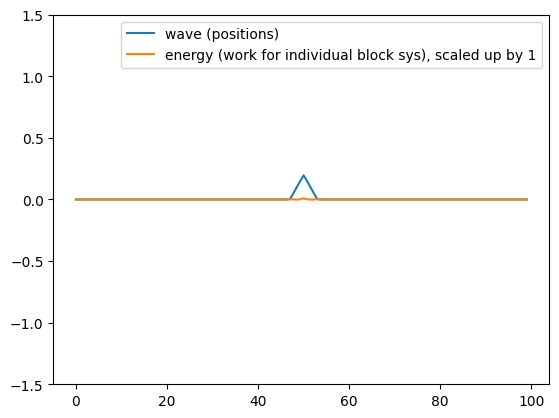

In [ ]:
fig, ax = plt.subplots()
wave, = ax.plot(range(N), y, label='wave (positions)')
energy, = ax.plot(range(N), E, label=f'energy (work for individual block sys), scaled up by {energy_scale}')
ax.legend()
ax.set_ylim(-1.5, 1.5)


ani = FuncAnimation(fig, animate, frames=500, interval=30, blit=True)
plt.show()
HTML(ani.to_jshtml())

testing stuff below